# Aimed logic
Using the logic and sequence from the `roundabout_simplification()` function(s) the idea is to generalize such approach to be able to simnplify some complex junctions. 
For that the following sequence is expected to be developed:
## pseudocode
- select invalid polygons (using shape index)
    - remove the roundabouts
    - separate the small/odd polys from the rest
- select adjacent polygons
- identify incoming lines/entry points (unique)
- calculate the closest point (or mid point between original nodes)
- create extending line
- delete unnecesary vertices
- remove degree 2 edges

In [56]:
import geopandas as gpd
import numpy as np
import pandas as pd
import pygeos
from shapely.geometry import LineString, Point, MultiPoint
from shapely.ops import linemerge, polygonize

from momepy import COINS, CircularCompactness

In [2]:
from scipy.stats import norm, gaussian_kde
from scipy.signal import argrelextrema

In [3]:
# for development only
import matplotlib.pyplot as plt

## helper functions

In [4]:
GPD_10 = True

In [5]:
def _selecting_rabs_from_poly(
    gdf,
    area_col="area",
    circom_threshold=0.7,
    area_threshold=0.85,
    include_adjacent=True,
):
    """
    From a GeoDataFrame of polygons, returns a GDF of polygons that are
    above the Circular Compaactness threshold.

    Return
    ________
    GeoDataFrames : round abouts and adjacent polygons
    """
    # calculate parameters
    # calculate parameters
    if area_col == "area":
        gdf.loc[:, area_col] = gdf.geometry.area
    circom_serie = CircularCompactness(gdf, area_col).series
    # selecting round about polygons based on compactness
    mask = circom_serie > circom_threshold
    rab = gdf[mask]
    # exclude those above the area threshold
    area_threshold_val = gdf.area.quantile(area_threshold)
    rab = rab[rab[area_col] < area_threshold_val]

    if include_adjacent is True:

        # calculating some parameters
        bounds = rab.geometry.bounds
        rab = pd.concat([rab, bounds], axis=1)
        rab["deltax"] = rab.maxx - rab.minx
        rab["deltay"] = rab.maxy - rab.miny
        rab["rab_diameter"] = rab[["deltax", "deltay"]].max(axis=1)

        # selecting the adjacent areas that are of smaller than itself
        if GPD_10:
            rab_adj = gpd.sjoin(gdf, rab, predicate="intersects")
        else:
            rab_adj = gpd.sjoin(gdf, rab, op="intersects")

        area_right = area_col + "_right"
        area_left = area_col + "_left"
        area_mask = rab_adj[area_right] >= rab_adj[area_left]
        rab_adj = rab_adj[area_mask]
        rab_adj.index.name = "index"

        # adding a hausdorff_distance threshold
        rab_adj["hdist"] = 0
        # TODO: (should be a way to verctorize)
        for i, group in rab_adj.groupby("index_right"):
            for g in group.itertuples():
                hdist = g.geometry.hausdorff_distance(rab.loc[i].geometry)
                rab_adj.loc[g.Index, "hdist"] = hdist

        rab_plus = rab_adj[rab_adj.hdist < rab_adj.rab_diameter]

    else:
        rab["index_right"] = rab.index
        rab_plus = rab

    # only keeping relevant fields
    geom_col = rab_plus.geometry.name
    rab_plus = rab_plus[[geom_col, "index_right"]]

    return rab_plus

def _coins_filtering_many_incoming(incoming_many, angle_threshold=0):
    """
    Used only for the cases when more than one incoming line touches the
    roundabout.
    """
    idx_out_many_incoming = []
    # For each new connection, evaluate COINS and select the group from which the new
    # line belongs
    # TODO ideally use the groupby object on line_wkt used earlier
    for g, x in incoming_many.groupby("line_wkt"):
        gs = gpd.GeoSeries(pd.concat([x.geometry, x.line]), crs=incoming_many.crs)
        gdf = gpd.GeoDataFrame(geometry=gs)
        gdf.drop_duplicates(inplace=True)

        coins = COINS(gdf, angle_threshold=angle_threshold)
        group_series = coins.stroke_attribute()
        gdf["coins_group"] = group_series
        # selecting the incoming and its extension
        coins_group_filter = gdf.groupby("coins_group").count() == 1
        f = gdf.coins_group.map(coins_group_filter.geometry)
        idxs_remove = gdf[f].index
        idx_out_many_incoming.extend(idxs_remove)

    incoming_many_reduced = incoming_many.drop(idx_out_many_incoming, axis=0)

    return incoming_many_reduced

    
def _selecting_incoming_lines(rab_multipolygons, edges, angle_threshold=0):
    """
    Selecting only the lines that are touching but not covered by
    the ``rab_plus``.
    If more than one LineString is incoming to ``rab_plus``, COINS algorithm
    is used to select the line to be extended further.
    """
    # selecting the lines that are touching but not covered by
    if GPD_10:
        touching = gpd.sjoin(edges, rab_multipolygons, predicate="touches")
        edges_idx, rabs_idx = rab_multipolygons.sindex.query_bulk(
            edges.geometry, predicate="covered_by"
        )
    else:
        touching = gpd.sjoin(edges, rab_multipolygons, op="touches")
        edges_idx, rabs_idx = rab_multipolygons.sindex.query_bulk(
            edges.geometry, op="covered_by"
        )
    idx_drop = edges.index.take(edges_idx)
    touching_idx = touching.index
    ls = list(set(touching_idx) - set(idx_drop))

    incoming = touching.loc[ls]

    # figuring out which ends of incoming edges needs to be connected to the center_pt
    incoming["first_pt"] = incoming.geometry.apply(lambda x: Point(x.coords[0]))
    incoming["dist_fisrt_pt"] = incoming.center_pt.distance(incoming.first_pt)
    incoming["last_pt"] = incoming.geometry.apply(lambda x: Point(x.coords[-1]))
    incoming["dist_last_pt"] = incoming.center_pt.distance(incoming.last_pt)
    lines = []
    for i, row in incoming.iterrows():
        if row.dist_fisrt_pt < row.dist_last_pt:
            lines.append(LineString([row.first_pt, row.center_pt]))
        else:
            lines.append(LineString([row.last_pt, row.center_pt]))
    incoming["line"] = gpd.GeoSeries(lines, index=incoming.index, crs=edges.crs)

    # checking in there are more than one incoming lines arriving to the same point
    # which would create several new lines
    incoming["line_wkt"] = incoming.line.to_wkt()
    grouped_lines = incoming.groupby(["line_wkt"])["line_wkt"]
    count_s = grouped_lines.count()

    # separating the incoming roads that come on their own to those that come in groups
    filter_count_one = pd.DataFrame(count_s[count_s == 1])
    filter_count_many = pd.DataFrame(count_s[count_s > 1])
    incoming_ones = pd.merge(
        incoming, filter_count_one, left_on="line_wkt", right_index=True, how="inner"
    )
    incoming_many = pd.merge(
        incoming, filter_count_many, left_on="line_wkt", right_index=True, how="inner"
    )
    incoming_many_reduced = _coins_filtering_many_incoming(
        incoming_many, angle_threshold=angle_threshold
    )

    incoming_all = gpd.GeoDataFrame(
        pd.concat([incoming_ones, incoming_many_reduced]), crs=edges.crs
    )

    return incoming_all, idx_drop


## loading data

<AxesSubplot:>

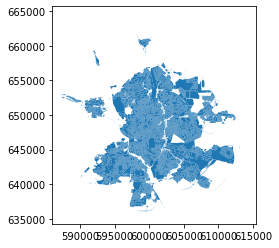

In [6]:
# loading data from file
mad = gpd.read_file(
    "/Users/gregoriomaya/Desktop/GSoc_2022/gsoc2022_network_simpl/data/madrid2062.gpkg"
)
mad.set_index(["u", "v", "key"], inplace=True)

mad_polys = polygonize(mad.geometry)
mad_polys = gpd.GeoDataFrame(geometry=[g for g in mad_polys], crs=mad.crs)
mad_polys.plot()

## Developing code

### selecting invalid polys
excluding roundabouts

In [7]:
def _create_shape_index(gdf):
    """
    Martin's shape index based on area and minimum_bounding_circle.
    """
    # Extract underlying PyGEOS geometries pygeos understands (minimum_bounding_circle is not yet exposed in geopandas)
    ga = gdf.geometry.array.data
    # measure area
    gdf["area"] = gdf.area
    # generate minimum bounding circle
    circles = gpd.GeoDataFrame(
        geometry=gpd.GeoSeries(pygeos.minimum_bounding_circle(ga), crs=gdf.crs)
    )
    # measure MBC's area
    circles["circle_area"] = circles.area
    # measure Reock (circular) compactness
    gdf["reock"] = gdf["area"] / circles["circle_area"]
    # measure direct shape index that captures banana-like relationship between area and Reock compactness in a one dimension
    gdf["shape_index"] = gdf["area"] / np.sqrt(circles["circle_area"])

    return gdf


In [8]:
def _selecting_invalid_polys(gdf):
    """
    From a GeoDataFrame of polygons, returns a GDF of polygons that are
    considered 'invalid' based on a threshold on shape index.
    """
    # 
    gdf_shape_idx = _create_shape_index(gdf)

    # filtering out the selected roundabouts
    rab_plus = _selecting_rabs_from_poly(gdf_shape_idx, area_col="area")
    rab_plus_idx = rab_plus.index
    rab_mask = list(dict.fromkeys(rab_plus_idx))
    pre_inv_polys = gdf_shape_idx.drop(rab_mask)

    # find threshold to mark valid-invalid
    shape_idx = pre_inv_polys["shape_index"].to_numpy()
    shape_idx = np.delete(shape_idx, 0)
    
    # Evaluate KDE
    scipy_kernel = gaussian_kde(shape_idx)

    mask = (pre_inv_polys.area <= 50000) & (pre_inv_polys.reock < 0.7)
    max_area_lim = pre_inv_polys[mask].shape_index.max()
    
    num_samples = len(shape_idx) #the greater the more accurate the result but also more expensive
    X_plot = np.linspace(0, max_area_lim, num_samples)
    
    v = scipy_kernel.evaluate(X_plot)
    
    # TODO
    # sgenerating a smoother sample to properly capture the inflections
    #tck = interpolate.splrep(X_plot, v)
    #smooth = interpolate.splev(X_plot, tck )

    minima_ind = argrelextrema(v, np.less)
    infls = minima_ind[0]
    threshold_val = X_plot[infls][0]
    
    inv_polys = pre_inv_polys[pre_inv_polys.shape_index <= threshold_val]
   
    return inv_polys

In [193]:
def _invalid_adjacency_grouping(invalid_polys_gdf, edges_gdf):
    """ 
    From a selection of invalid polygons (for network analysis/ not to confuse with invild geometry)
    creates groups based on their adjacency and acounts the number of forming edges for each polygon.
    """ 
    # creating invalid groups
    groups = gpd.GeoSeries([geom for geom in invalid_polys_gdf.unary_union.geoms])
    groups_gdf = gpd.GeoDataFrame(geometry = groups, crs = invalid_polys_gdf.crs)
    # SJOIN assigns all but the bridges (where polygons "intersect" but are not "within")
    grouped_polys = invalid_polys_gdf.sjoin(groups_gdf, predicate= "within")
    grouped_polys.drop_duplicates(subset = ["geometry"], inplace= True)
    grouped_polys.rename(columns={"index_right": "group_idx"}, inplace= True) 

    # find number of edges that define each poly's pseudo shape (eg.triangle)
    # likely replaceable with a bulk_query since it's done just for counting #TODO
    covered_edges = grouped_polys.sjoin(mad, predicate= "covers")
    covered_edges.index.name = "poly_index"
    grouped_polys["num_edges"] = covered_edges.groupby("poly_index").geometry.count()
    grouped_polys = grouped_polys.reset_index().set_index("group_idx")
    grouped_polys
    
    return grouped_polys

## Testing cells

In [194]:
test = _selecting_invalid_polys(mad_polys)

print(test.tail())

m = test.area <= 5000
test[m].reset_index().explore(column= "area", tiles = "CartoDB positron")

                                                geometry         area  \
15865  POLYGON ((607375.917 648046.834, 607380.493 64...   351.519713   
15871  POLYGON ((596491.485 647033.097, 596494.994 64...   264.528642   
15872  POLYGON ((607335.613 654877.039, 607338.353 65...  4501.955492   
15874  POLYGON ((598455.263 649722.634, 598529.348 64...  1635.331527   
15875  POLYGON ((597342.298 642632.823, 597347.643 64...  1218.554688   

          reock  shape_index  
15865  0.229958     8.990816  
15871  0.604097    12.641238  
15872  0.041625    13.689190  
15874  0.350309    23.934735  
15875  0.366052    21.119996  


In [195]:
test_2 = _invalid_adjacency_grouping(test, mad)

test_2.head(2)
test_2.explore(tiles = "CartoDB positron")

# testing some rules
if the invalid polygon 
- has only three edges forming it AND
- is on its own (single group) AND 
- is smaller than X (TBD)
> THEN
>- find the point in the two points on the same COINS group
>- create a point in the middle 
>- extend point to new middle point
>- delete old lines
>- remove degree two

In [179]:
groups = gpd.GeoSeries([geom for geom in test.unary_union.geoms])
groups_gdf = gpd.GeoDataFrame(geometry = groups, crs = test.crs)
# SJOIN assigns all but the bridges (where polygons "intersect" but are not "within")
grouped_polys = test.sjoin(groups_gdf, predicate= "within")
grouped_polys.drop_duplicates(subset = ["geometry"], inplace= True)
grouped_polys.rename(columns={"index_right": "group_idx"}, inplace= True) 

In [191]:
# find number of edges that define each poly's pseudo shape (eg.triangle)
# likely replaceable with a bulk_query since it's done just for counting #TODO
covered_edges = grouped_polys.sjoin(mad, predicate= "covers")
covered_edges.index.name = "poly_index"
grouped_polys["num_edges"] = covered_edges.groupby("poly_index").geometry.count()
grouped_polys = grouped_polys.reset_index().set_index("group_idx")
grouped_polys

,index,geometry,area,reock,shape_index,num_edges
group_idx,,,,,,
783,2,"POLYGON ((600242.659 646690.974, 600244.482 64...",207.984091,0.251124,7.227014,3
703,4,"POLYGON ((599863.154 646288.014, 599875.286 64...",1635.027920,0.047973,8.856481,4
703,5,"POLYGON ((599875.286 646302.266, 599863.154 64...",456.883748,0.111109,7.124869,3
703,9,"POLYGON ((599881.908 646391.007, 599875.286 64...",1131.244656,0.068426,8.798102,4
703,11,"POLYGON ((599859.268 646129.176, 599858.320 64...",1007.127524,0.081251,9.045983,4
...,...,...,...,...,...,...
1645,15859,"POLYGON ((611896.496 649295.643, 611893.712 64...",3068.992236,0.113146,18.634507,2
1563,15863,"POLYGON ((608688.790 650220.475, 608689.475 65...",533.673205,0.417916,14.934210,1
291,15871,"POLYGON ((596491.485 647033.097, 596494.994 64...",264.528642,0.604097,12.641238,1


In [192]:
grouped_polys.explore()

In [134]:
# _____
#isolating single-polygon groups
m = grouped_polys.group_idx.value_counts() == 1
single_polys = reidx.loc[m]

single_polys.head(2)

,index,geometry,area,reock,shape_index,num_edges
group_idx,,,,,,
783,2,"POLYGON ((600242.659 646690.974, 600244.482 64...",207.984091,0.251124,7.227014,1
1482,42,"POLYGON ((607113.906 648588.595, 607103.945 64...",3849.416336,0.030399,10.817460,1


In [518]:
touching_edges = mad.sjoin(grouped_polys, predicate= "touches")

In [521]:
touching_edges.head()

osmid  oneway lanes  \
u          v          key                                       
171946     26513145   0               807334397    True     4   
           3280496563 0               807334397    True     4   
           1209330272 0               321307751    True   nan   
329991000  3280496563 0    [4526341, 864841823]    True     4   
1209330640 1209330272 0                29975021    True   nan   

                                                          name      highway  \
u          v          key                                                     
171946     26513145   0                     Calle de Velázquez     tertiary   
           3280496563 0                     Calle de Velázquez     tertiary   
           1209330272 0                     Calle de Velázquez  residential   
329991000  3280496563 0    ['Calle Alcalá', 'Calle de Alcalá']     tertiary   
1209330640 1209330272 0                        Calle de Alcalá  residential   

                          maxspeed reversed   length        from          to  \
u          v          key                                                      
171946     26513145   0         50    False   41.093      171946    26513145   
           3280496563 0         50    False   30.852  3280496563      171946   
           1209330272 0        nan    False   32.461  1209330272      171946   
329991000  3280496563 0         50    False   45.893   329991000  3280496563   
1209330640 1209330272 0         30    False  104.908  1209330640  1209330272   

                           ... width landuse est_width  \
u          v          key  ...                           
171946     26513145   0    ...  None    None      None   
           3280496563 0    ...  None    None      None   
           1209330272 0    ...  None    None      None   
329991000  3280496563 0    ...  None    None      None   
1209330640 1209330272 0    ...  None    None      None   

                                                                    geometry  \
u          v          key                                                      
171946     26513145   0    LINESTRING (600247.796 646721.109, 600250.422 ...   
           3280496563 0    LINESTRING (600242.659 646690.974, 600244.482 ...   
           1209330272 0    LINESTRING (600265.192 646697.507, 600261.267 ...   
329991000  3280496563 0    LINESTRING (600208.217 646663.322, 600218.390 ...   
1209330640 1209330272 0    LINESTRING (600356.658 646748.919, 600348.995 ...   

                          index_right        area     reock shape_index  \
u          v          key                                                 
171946     26513145   0             2  207.984091  0.251124    7.227014   
           3280496563 0             2  207.984091  0.251124    7.227014   
           1209330272 0             2  207.984091  0.251124    7.227014   
329991000  3280496563 0             2  207.984091  0.251124    7.227014   
1209330640 1209330272 0             2  207.984091  0.251124    7.227014   

                          group_idx                      center_pt  
u          v          key                                           
171946     26513145   0         783  POINT (600250.831 646701.559)  
           3280496563 0         783  POINT (600250.831 646701.559)  
           1209330272 0         783  POINT (600250.831 646701.559)  
329991000  3280496563 0         783  POINT (600250.831 646701.559)  
1209330640 1209330272 0         783  POINT (600250.831 646701.559)  

[5 rows x 25 columns]

# Finding threshold for INVALID poly

In [ ]:
mask_s = (test.area <= 50000) & (test.reock < 0.7)

test[mask_s].shape_index.plot.hist(
    bins=80, edgecolor="white", figsize=(12, 6)
    )
plt.axvline(25, color="red", linewidth=2) #estimate of threshold
plt.show()

In [ ]:
from scipy.stats import norm, gaussian_kde

shape_idx = test["shape_index"].to_numpy()
shape_idx = np.delete(shape_idx, 0)

scipy_kernel = gaussian_kde(shape_idx)

# Evaluate kde 
max_area_lim = test[mask_s].shape_index.max()
num_samples = len(shape_idx) #the greater the more accurate the result but also more expensive
X_plot = np.linspace(0, max_area_lim, num_samples)

v = scipy_kernel.evaluate(X_plot)

plt.plot(X_plot, v, 'k')
plt.show()

In [ ]:
# TODO
# sgenerating a smoother sample to properly capture the inflections
#tck = interpolate.splrep(X_plot, v)
#smooth = interpolate.splev(X_plot, tck )

minima_ind = argrelextrema(v, np.less)
infls = minima_ind[0]

threshold_val = X_plot[infls][0]
print("Threshold val:\n", threshold_val)

# plotting the results
#plt.plot(X_plot ,smooth, label = "smooth")
plt.plot(X_plot, v, 'k', label = "KDE", linestyle='dashed')

#looping in case there's more than one
for i, infl in enumerate(infls, 1):
    plt.axvline(x=X_plot[infl], color="red", label=f'Minima Point {i}')
plt.legend(bbox_to_anchor=(1.55, 1.0))
plt.show()


In [ ]:
from sklearn.neighbors import KernelDensity

# Calculate the bandwidth for SKLEARN tested latter 
bw = scipy_kernel.factor * np.std(shape_idx)
print("Bandwidth:\n", bw)

max_area_lim = test[mask_s].shape_index.max()
X_plot = np.linspace(0, max_area_lim, 1000)

shape_idx = test["shape_index"].to_numpy()
# Bandwith with sklearn method is not easy to determine
kde = KernelDensity(bandwidth = bw, kernel = 'gaussian').fit(shape_idx)

X_plot.shape = (X_plot.size,1)
sample = kde.score_samples(X_plot)

fig, ax = plt.subplots()
ax.plot(X_plot[:, 0], np.exp(sample))
plt.show()